In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from functools import partial
from Target import *
from Animation_Gibbs import *

In [2]:
def rejection_sampling(pi,q=stat.norm(loc=1/3,scale=5)):
    accept=False
    x=0
    while not accept:
        x=q.rvs()
        alpha=pi(x)/q.pdf(x)
        U=np.random.uniform(0,1)
        accept=(U<alpha)
    return x

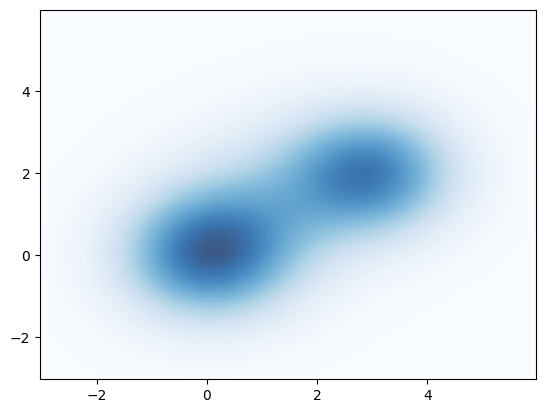

In [3]:
# Plot of the gaussian mixture target 
X, Y = np.mgrid[-3:6:.05, -3:6:.05]
pos = np.dstack((X, Y))
fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.pcolormesh(X, Y, gausmix(pos),cmap='Blues',alpha=0.8)
plt.show()

In [4]:
def Gibbs_sampler(proba1,proba2,init_state,n_iter):
    sample=np.zeros(shape=(n_iter,2))
    sample[0]=init_state
    for i in range(1,n_iter):
        partial_proba1=partial(proba1,y=sample[i-1,1])
        sample[i,0]=rejection_sampling(partial_proba1)
        partial_proba2=partial(proba2,x=sample[i,0])
        sample[i,1]=rejection_sampling(partial_proba2)
    return sample


def Gibbs_sampler(proba1,proba2,init_state,n_iter):
    sample=np.zeros(shape=(n_iter,2))
    sample[0]=init_state
    for i in range(1,n_iter):
        partial_proba2=partial(proba2,x=sample[i-1,0])
        sample[i,1]=rejection_sampling(partial_proba2)
        partial_proba1=partial(proba1,y=sample[i,1])
        sample[i,0]=rejection_sampling(partial_proba1)
    return sample

In [5]:
sample1=Gibbs_sampler(proba1,proba2,np.array([1,0]),200)
sample=np.ones(shape=(200,3))
sample[:,0:2]=sample1

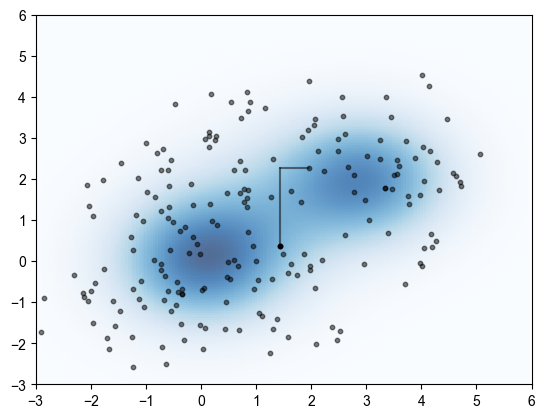

In [6]:
#Animation

xmin,xmax=-3,6
ymin,ymax=-3,6


fig, ax = plt.subplots()

background_plot(ax,target=gausmix,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax) # Add the background figure

particle = ax.scatter([], [], c='black',s=10, marker='o', alpha=1)  # Initial position with higher alpha
trail = ax.scatter([], [], c='black',s=10, marker='o', alpha=0.5)  # Particle trail with lower alpha
line1, = ax.plot([], [], c='black', alpha=0.5)  # Line connecting current and previous positions
line2, = ax.plot([], [], c='black', alpha=0.5)  # Line connecting current and previous positions

partial_init=partial(init,xmin=xmin,xmax=xmax,ymin=ymin,ymax=ymax,particle=particle,trail=trail,ax=ax,square=False)

# Create the animation
partial_update= partial(update,sample=sample,particle=particle,line1=line1,line2=line2,trail=trail)
ani = FuncAnimation(fig, partial_update, frames=200, init_func=partial_init, blit=True)

# Display the animation in the notebook
HTML(ani.to_jshtml())

In [7]:
n_iter=10000
sample1bis=Gibbs_sampler(proba1,proba2,np.array([0,0]),n_iter)
sample1=np.ones(shape=(n_iter,3))
sample1[:,0:2]=sample1bis
sample2bis=Gibbs_sampler(proba1,proba2,np.array([0,0]),n_iter)
sample2=np.ones(shape=(n_iter,3))
sample2[:,0:2]=sample2bis
sample3bis=Gibbs_sampler(proba1,proba2,np.array([0,0]),n_iter)
sample3=np.ones(shape=(n_iter,3))
sample3[:,0:2]=sample3bis


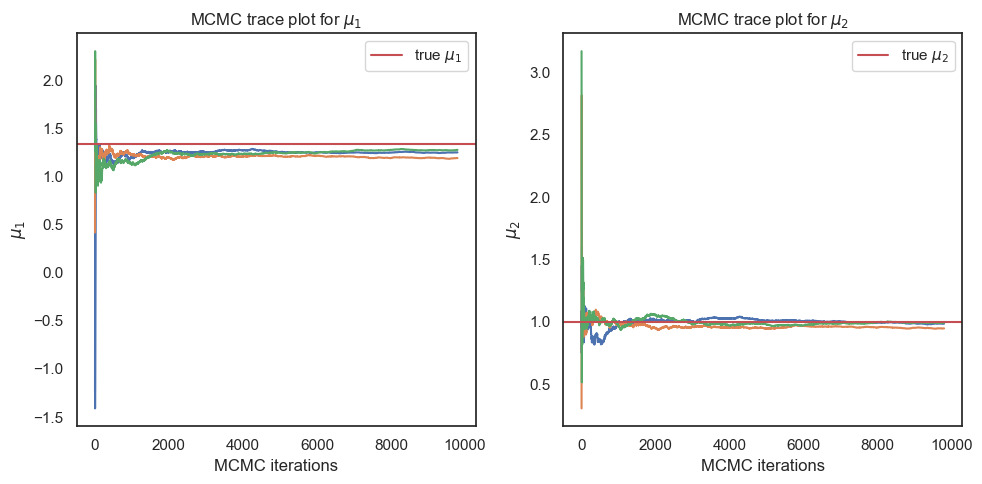

In [8]:
burnin=200

# Compute cumulative averages after burnin
Avgs = [calculate_cumulative_average(sample[burnin:]) for sample in [sample1, sample2, sample3]]

nb_gaussian = len(moy_list)
Truemean = np.cumsum(moy_list, axis=0)[-1] / nb_gaussian

fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns setup

for i in range(2):  # Assuming two parameters for simplicity
    for Avg in Avgs:
        axs[i].plot(Avg[:, i])
    axs[i].axhline(Truemean[i], color='r', label=f"true $\\mu_{i+1}$")
    axs[i].set_title(f'MCMC trace plot for $\\mu_{i+1}$')
    axs[i].set_xlabel('MCMC iterations')
    axs[i].set_ylabel(f'$\\mu_{i+1}$')
    axs[i].legend()

plt.tight_layout()
plt.show()
    